<a href="https://colab.research.google.com/github/ZPavlo/ClusteringComparing/blob/main/HDBSCAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline
import sys
import os
from google.colab import drive
drive.mount('/content/gdrive')
ROOT_DATA = '/content/gdrive/MyDrive/datasets/clustering_data'
SAVE_FORLDER = "/content/gdrive/MyDrive/datasets/images"

if not os.path.isdir(SAVE_FORLDER):
    os.mkdir(SAVE_FORLDER)

Mounted at /content/gdrive


In [2]:
!git clone https://github.com/ZPavlo/ClusteringComparing.git
sys.path.insert(0, "/content/ClusteringComparing")

Cloning into 'ClusteringComparing'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 101 (delta 63), reused 57 (delta 25), pack-reused 0
Receiving objects: 100% (101/101), 1.83 MiB | 27.55 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [3]:
!cd ClusteringComparing && git pull

Already up to date.


In [4]:
!pip install sklearn_extras
!pip install scikit-learn-extra
!pip install hdbscan

  Created wheel for sklearn-extras: filename=sklearn_extras-0.1.1-cp37-none-any.whl size=2206 sha256=cdd7e71953ecb5bc945a48de345085b2a7b0afe910b2e9ed6c375a7b3ec0c0fc
  Stored in directory: /root/.cache/pip/wheels/40/95/76/5c740a32631c60dd991fef0730234cd215f39acb898862a502
Successfully built sklearn-extras
     |████████████████████████████████| 1.7MB 30.7MB/s 
     |████████████████████████████████| 22.3MB 1.6MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
     |████████████████████████████████| 6.4MB 15.8MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311683 sha256=0af7ecedfba70919c678bd8646c62061c32bdd2f296dad1b65fd56fe4ae4d91e
  Stored in directory: /root/.cache/pip/wheels/42/63/fb/314ad6c3b270887a3ec

In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

sns.set()

## Datasets

In [6]:
from tools import make_plot

### Gaussian blobs

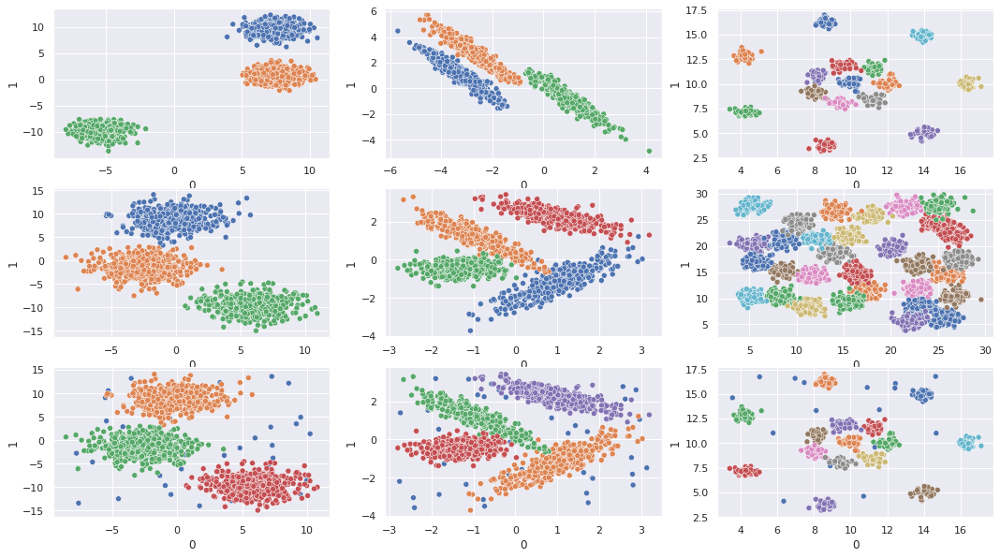

In [7]:
from datasets import get_data_blobs, get_data_blobs2, get_data_blobs3, \
                     get_data_blobs4, get_data_R15, get_data_d31, get_gaussian_data_3d, \
                     get_data_blobs2_noise, get_data_blobs4_noise, get_data_R15_noise, \
                     GAUSSIAN_BLOBS_DATA, GAUSSIAN_BLOBS_K 

fig, axes = plt.subplots(3, 3, figsize=(18, 10))

make_plot(*get_data_blobs(), axes=axes[0, 0])
make_plot(*get_data_blobs3(), axes=axes[0, 1])
make_plot(*get_data_R15(path=ROOT_DATA), axes=axes[0, 2])

make_plot(*get_data_blobs2(), axes=axes[1, 0])
make_plot(*get_data_blobs4(), axes=axes[1, 1])
make_plot(*get_data_d31(path=ROOT_DATA), axes=axes[1, 2])

make_plot(*get_data_blobs2_noise(), axes=axes[2, 0])
make_plot(*get_data_blobs4_noise(), axes=axes[2, 1])
make_plot(*get_data_R15_noise(path=ROOT_DATA), axes=axes[2, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian.png"))
plt.show()

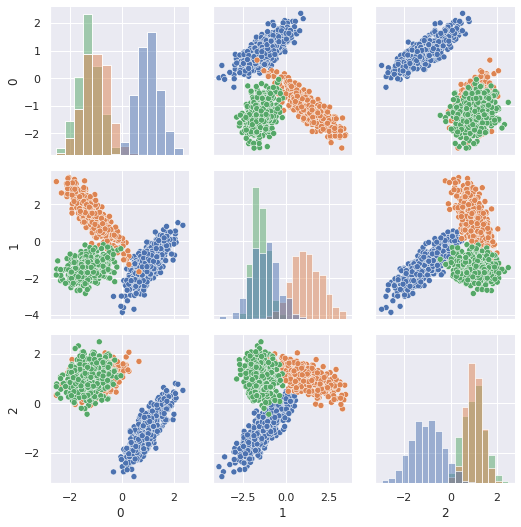

In [8]:
from tools import make_3d_plot

X, y = get_gaussian_data_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian3d.png"))
plt.show()

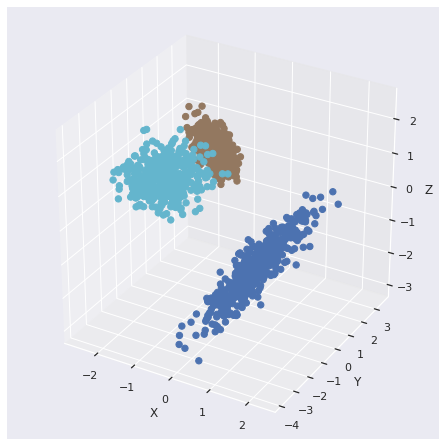

In [9]:
from tools import make_3d_plot

make_3d_plot(X, y)

### Unbalance Gaussian

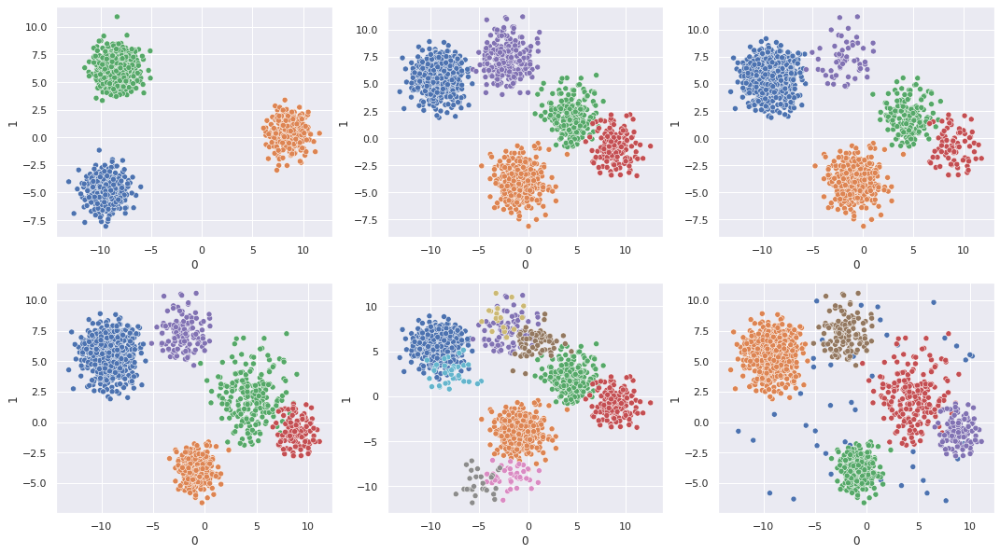

In [10]:
from datasets import get_data_unbalance1, get_data_unbalance2, get_data_unbalance3, \
                     get_data_unbalance4, get_data_unbalance5, get_data_unbalance6, \
                     UNBALANCED_GAUSSIAN_BLOBS_DATA, UNBALANCED_GAUSSIAN_BLOBS_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_unbalance1(), axes=axes[0, 0])
make_plot(*get_data_unbalance2(), axes=axes[0, 1])
make_plot(*get_data_unbalance3(), axes=axes[0, 2])
make_plot(*get_data_unbalance4(), axes=axes[1, 0])
make_plot(*get_data_unbalance5(), axes=axes[1, 1])
make_plot(*get_data_unbalance6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "unbalance gaussian.png"))
plt.show()

### Cube 

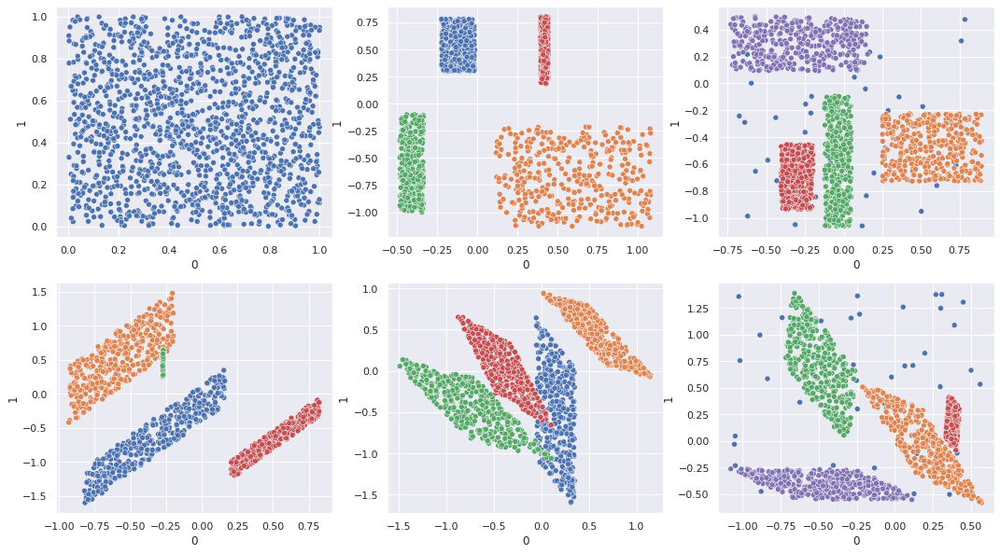

In [11]:
from datasets import get_data_cube, get_data_cube2, get_data_cube3, \
                     get_data_cube4, get_data_cube5, get_data_cube6, \
                     get_data_cube_3d, CUBES_RECT_PARALLEL_DATA, CUBES_RECT_PARALLEL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_cube(), axes=axes[0, 0])
make_plot(*get_data_cube2(), axes=axes[0, 1])
make_plot(*get_data_cube3(), axes=axes[1, 0])
make_plot(*get_data_cube4(), axes=axes[1, 1])
make_plot(*get_data_cube5(), axes=axes[0, 2])
make_plot(*get_data_cube6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "cube.png"))
plt.show()

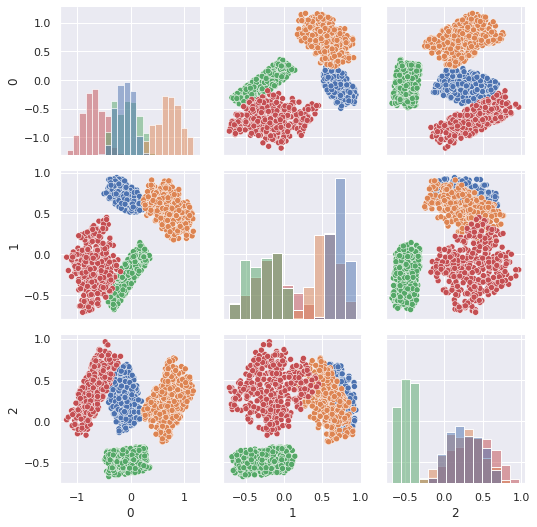

In [12]:
X, y = get_data_cube_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "cube3d.png"))
plt.show()

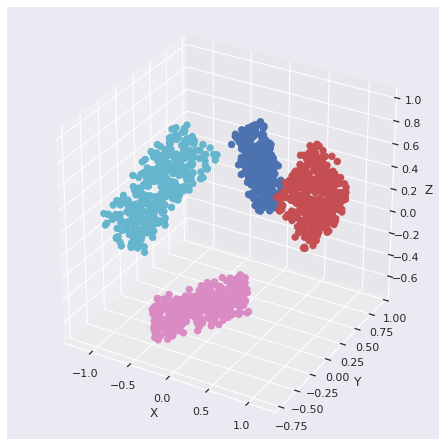

In [13]:
make_3d_plot(X, y)

### Non-spherical

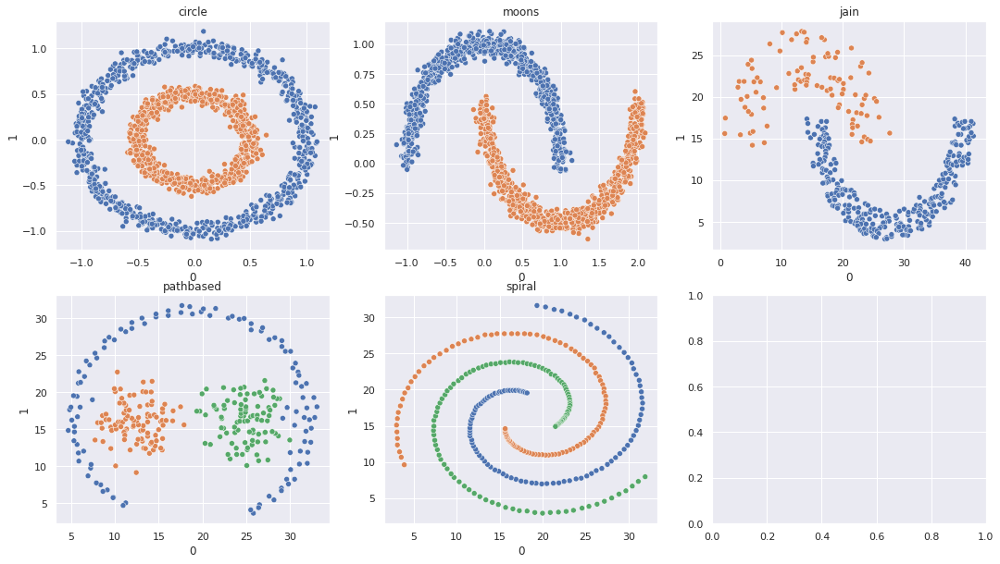

In [14]:
from datasets import get_data_circle, get_data_moons, get_data_jain, \
                     get_data_pathbased, get_data_spiral, NON_SPHERICAL_DATA, \
                     NON_SPHERICAL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_circle(), axes=axes[0, 0], title="circle")
make_plot(*get_data_moons(), axes=axes[0, 1], title="moons")
make_plot(*get_data_jain(path=ROOT_DATA), axes=axes[0, 2], title="jain")
make_plot(*get_data_pathbased(path=ROOT_DATA), axes=axes[1, 0], title="pathbased")
make_plot(*get_data_spiral(path=ROOT_DATA), axes=axes[1, 1], title="spiral")

plt.savefig(os.path.join(SAVE_FORLDER, "non-spherical.png"))
plt.show()

### Combining forms

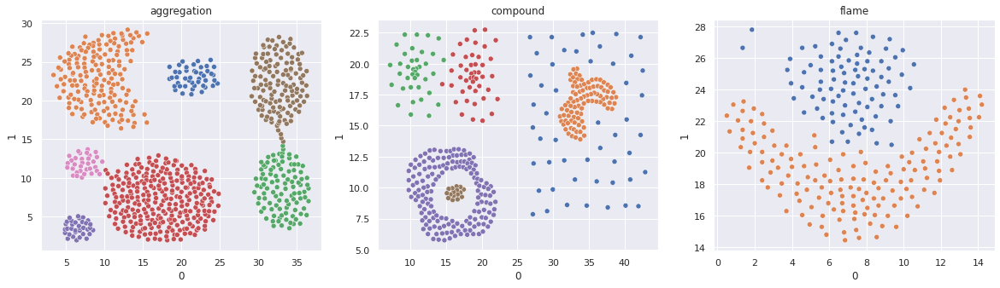

In [15]:
from datasets import get_data_aggregation, get_data_compound, get_data_flame, \
                     get_data_cube, OTHER_FORMS_DATA, OTHER_FORMS_K



fig, axes = plt.subplots(1, 3, figsize=(20, 5))

make_plot(*get_data_aggregation(path=ROOT_DATA), axes=axes[0], title="aggregation")
make_plot(*get_data_compound(path=ROOT_DATA), axes=axes[1], title="compound")
make_plot(*get_data_flame(path=ROOT_DATA), axes=axes[2], title="flame")

plt.savefig(os.path.join(SAVE_FORLDER, "combining forms.png"))
plt.show()

## Data clustering

In [16]:
import numpy as np

from hdbscan_utils import run_HDBSCAN_on_data_with_K, run_HDBSCAN_on_data, run_on_3d_data

In [17]:
import os

if not os.path.exists(os.path.join(ROOT_DATA, "images")):
    os.mkdir(os.path.join(ROOT_DATA, "images"))

### Gaussian blobs

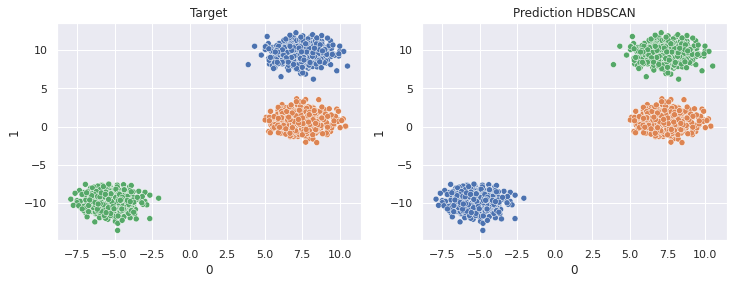

[HDBSCAN]: accuracy 1.0000, time 0.089, mem 1.799Mb


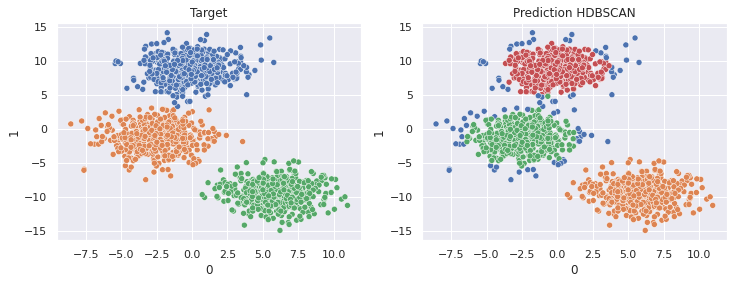

[HDBSCAN]: accuracy 0.9618, time 0.078, mem 1.440Mb


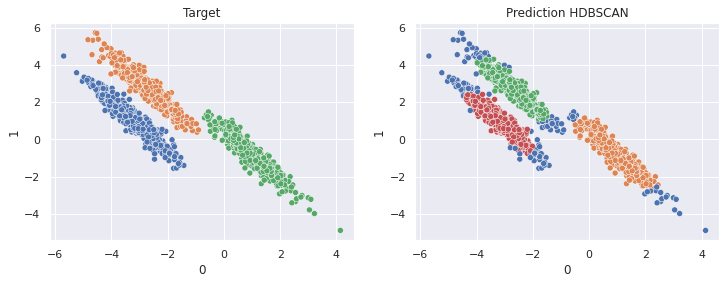

[HDBSCAN]: accuracy 0.9362, time 0.104, mem 1.733Mb


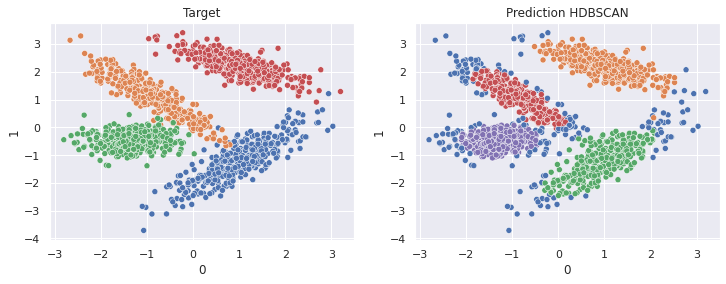

[HDBSCAN]: accuracy 0.9263, time 0.086, mem 1.575Mb


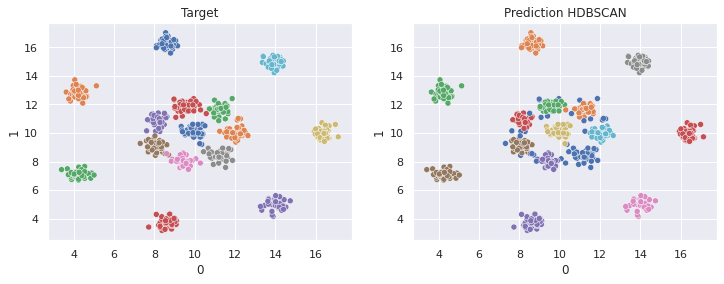

[HDBSCAN]: accuracy 0.9898, time 0.054, mem 0.201Mb


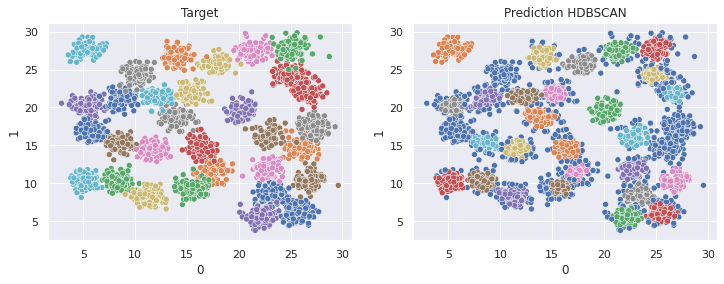

[HDBSCAN]: accuracy 0.9626, time 0.128, mem 0.846Mb


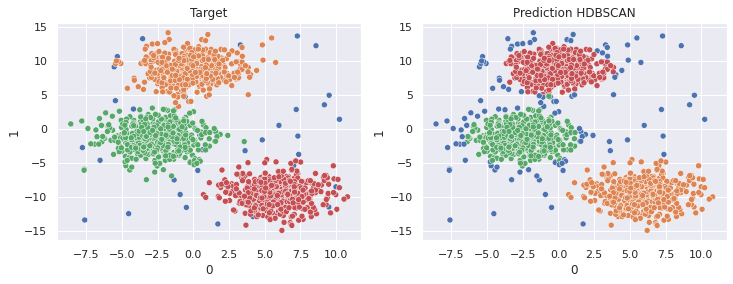

[HDBSCAN]: accuracy 0.9566, time 0.112, mem 1.751Mb


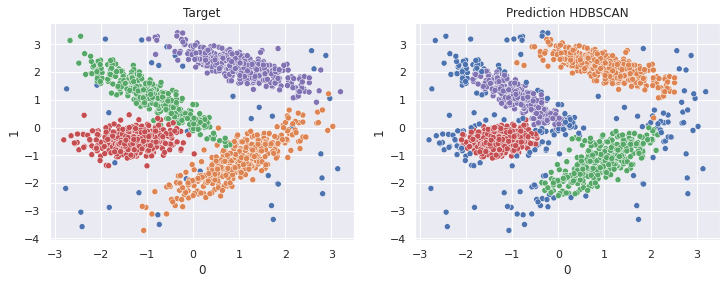

[HDBSCAN]: accuracy 0.9221, time 0.094, mem 1.573Mb


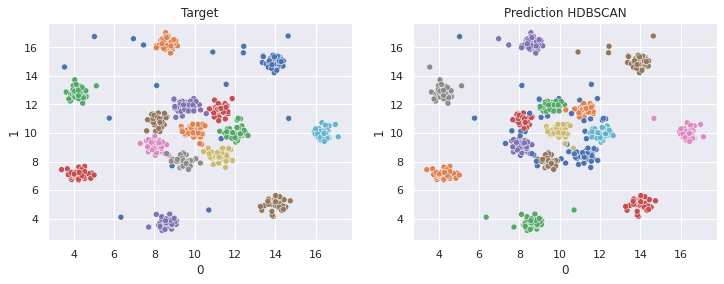

[HDBSCAN]: accuracy 0.9864, time 0.045, mem 0.209Mb


In [18]:
min_cluster_size_range = [50, 40, 45, 40, 10, 10, 45, 40, 10]

run_HDBSCAN_on_data_with_K(GAUSSIAN_BLOBS_DATA, min_cluster_size_range, "GAUSSIAN_BLOBS", path=ROOT_DATA)

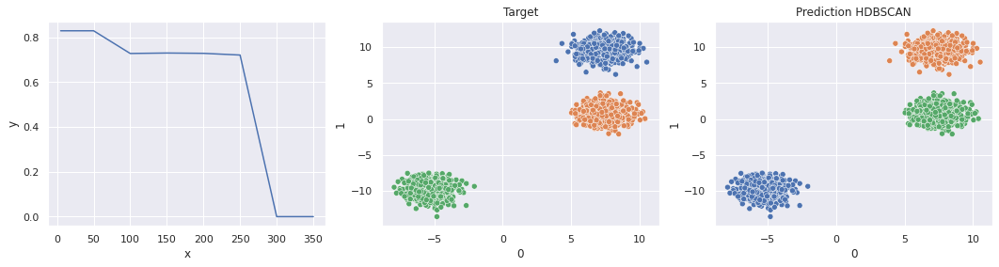

Best min_cluster_size = 5
[HDBSCAN]: accuracy 1.0000


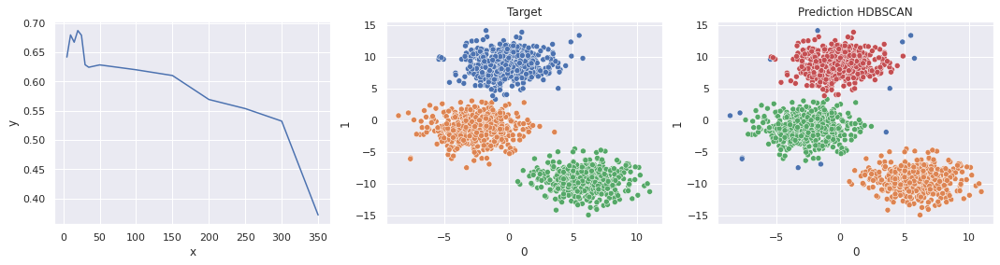

Best min_cluster_size = 20
[HDBSCAN]: accuracy 0.9934


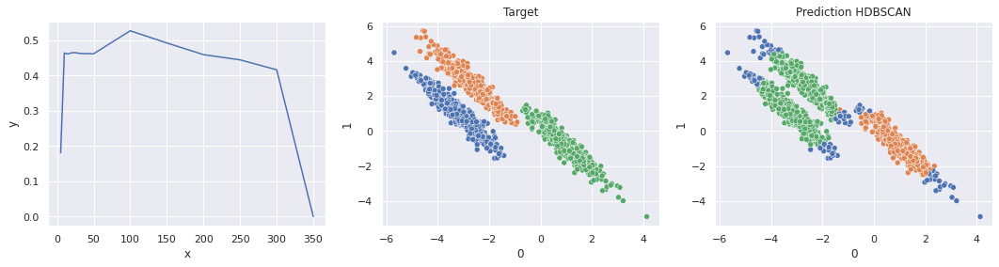

Best min_cluster_size = 100
[HDBSCAN]: accuracy 0.7620


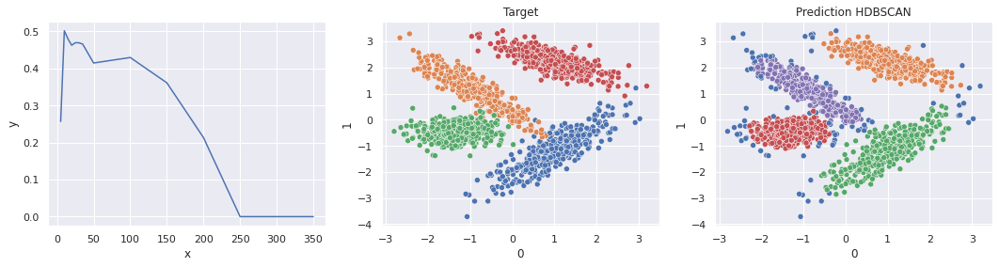

Best min_cluster_size = 10
[HDBSCAN]: accuracy 0.9628


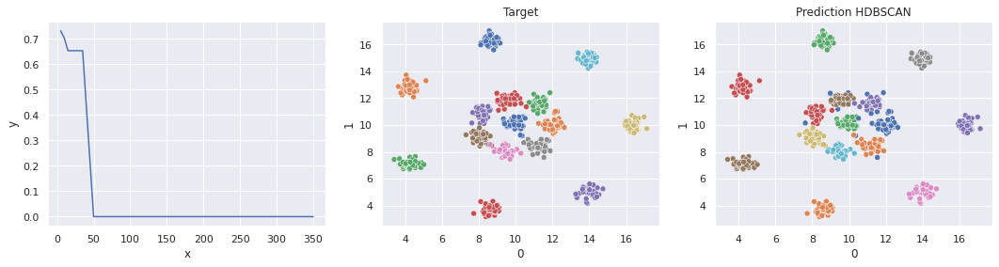

Best min_cluster_size = 5
[HDBSCAN]: accuracy 0.9946


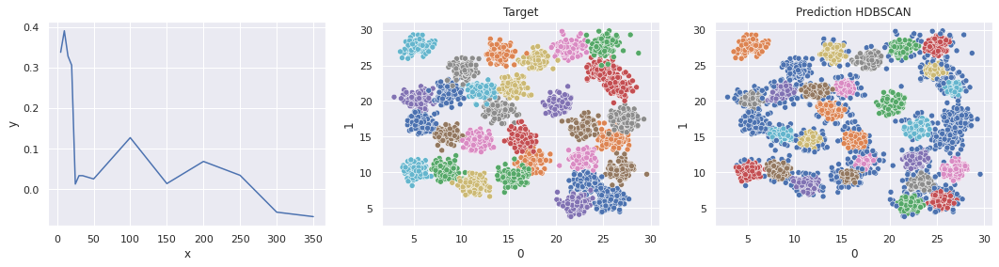

Best min_cluster_size = 10
[HDBSCAN]: accuracy 0.9626


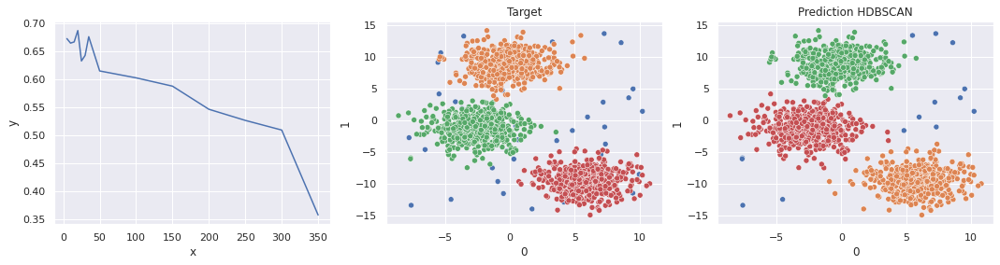

Best min_cluster_size = 20
[HDBSCAN]: accuracy 0.9825


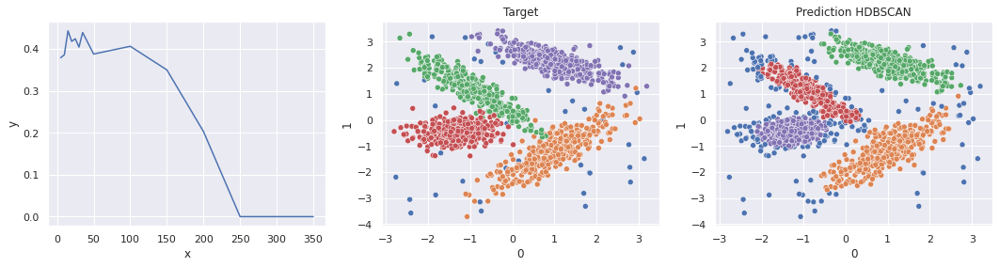

Best min_cluster_size = 15
[HDBSCAN]: accuracy 0.9391


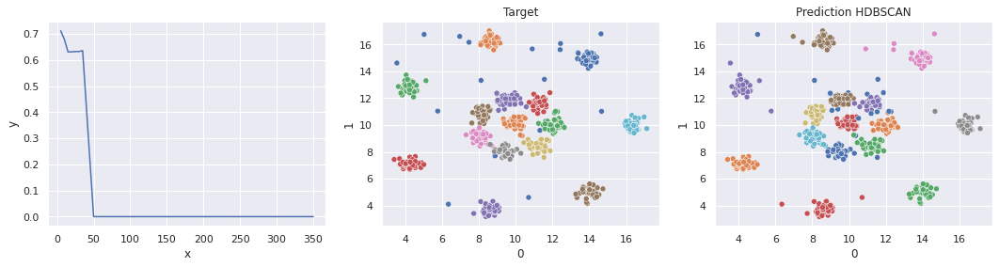

Best min_cluster_size = 5
[HDBSCAN]: accuracy 0.9913


In [19]:
run_HDBSCAN_on_data(GAUSSIAN_BLOBS_DATA, list(range(5, 40, 5)) + list(range(50, 400, 50)), "GAUSSIAN_BLOBS", path=ROOT_DATA)

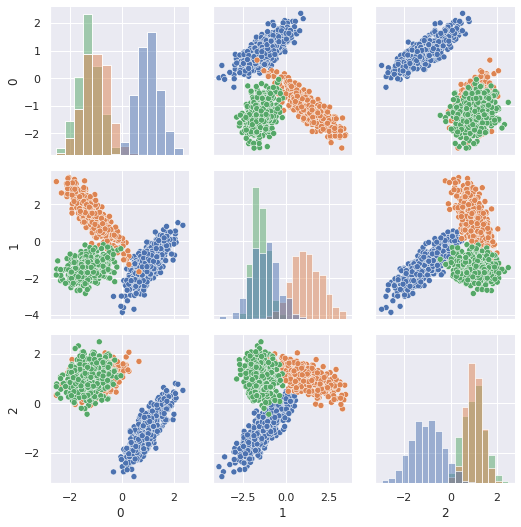

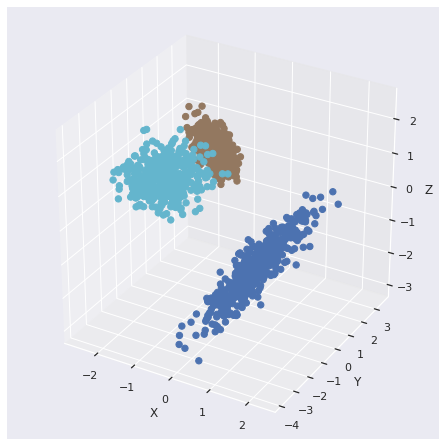

[HDBSCAN]: accuracy 0.7776, time 0.117, mem 0.284Mb


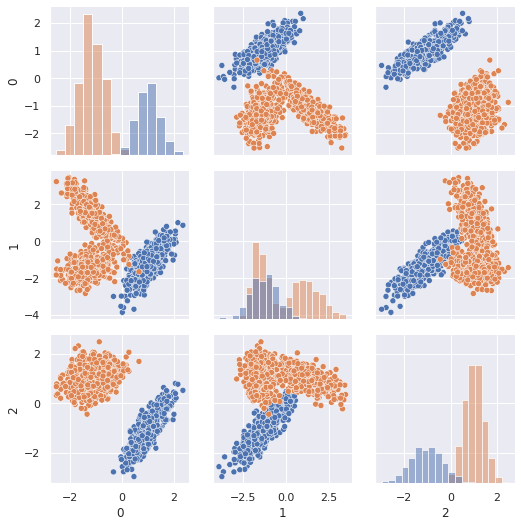

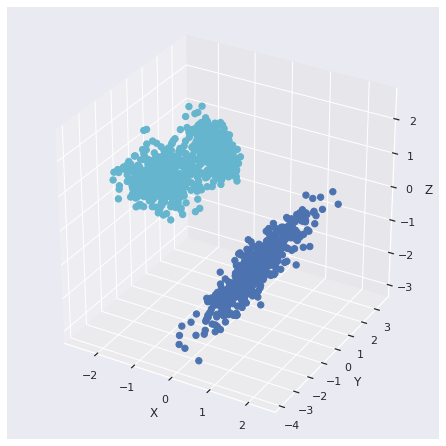

In [20]:
X, y = get_gaussian_data_3d()

run_on_3d_data(X, y, 2, data_name="GAUSSIAN_BLOBS", path=ROOT_DATA)

### Unbalance Gaussian

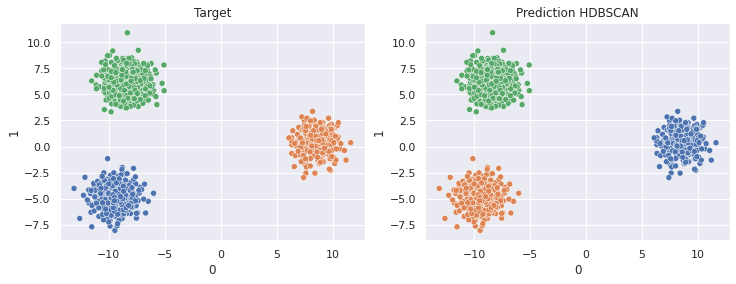

[HDBSCAN]: accuracy 1.0000, time 0.075, mem 0.256Mb


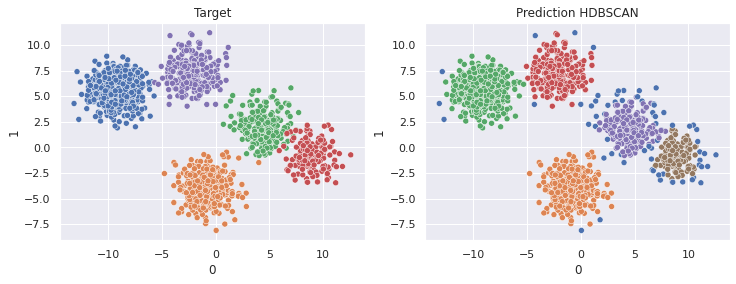

[HDBSCAN]: accuracy 0.9841, time 0.086, mem 0.254Mb


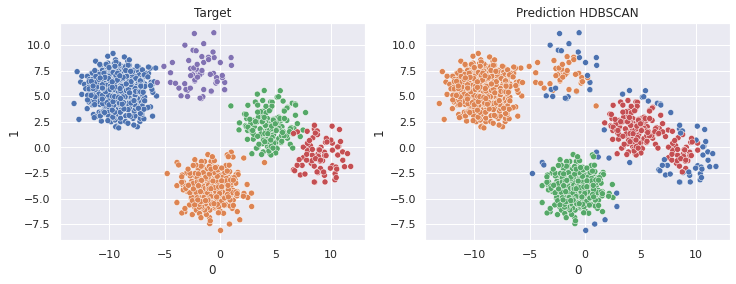

[HDBSCAN]: accuracy 0.9556, time 0.090, mem 1.576Mb


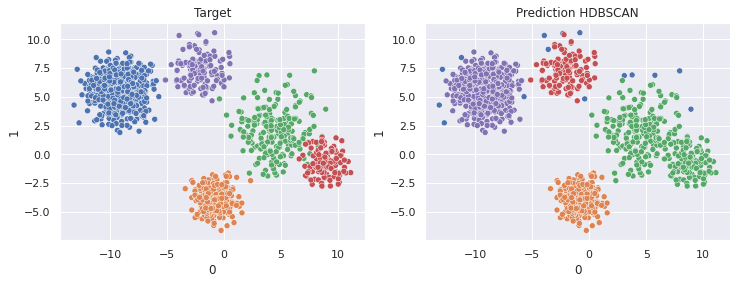

[HDBSCAN]: accuracy 0.9751, time 0.085, mem 0.265Mb


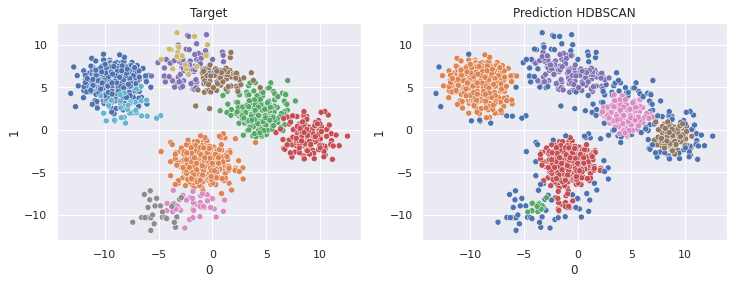

[HDBSCAN]: accuracy 0.9380, time 0.087, mem 0.492Mb


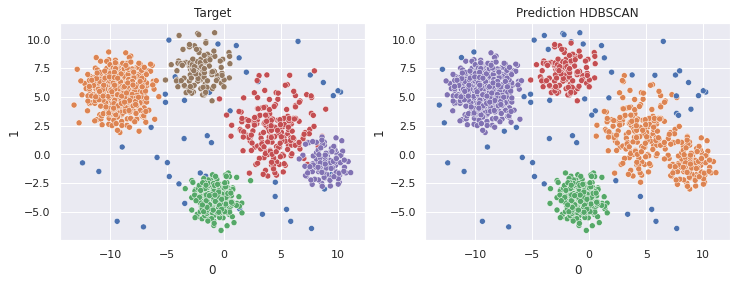

[HDBSCAN]: accuracy 0.9709, time 0.104, mem 0.268Mb


In [21]:
min_cluster_size_range = [5, 5, 40, 4, 10, 4]

run_HDBSCAN_on_data_with_K(UNBALANCED_GAUSSIAN_BLOBS_DATA, min_cluster_size_range, "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

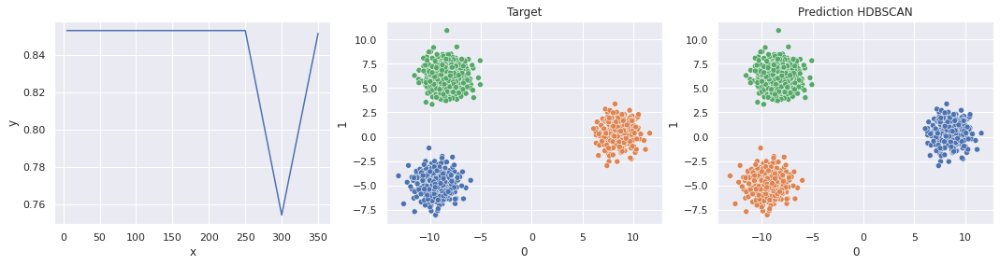

Best min_cluster_size = 5
[HDBSCAN]: accuracy 1.0000


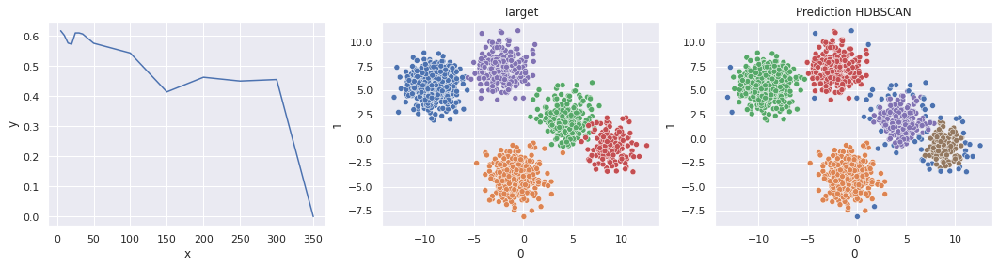

Best min_cluster_size = 5
[HDBSCAN]: accuracy 0.9841


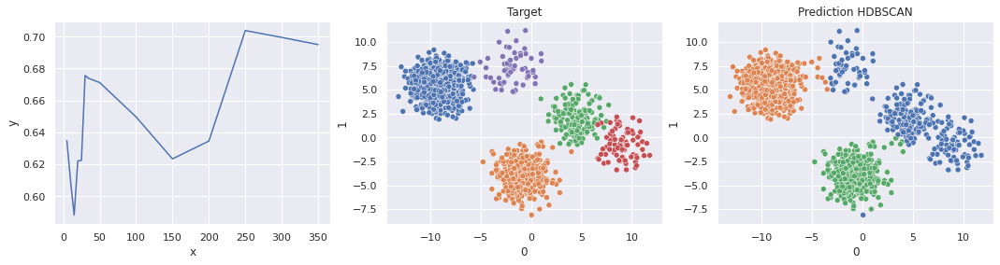

Best min_cluster_size = 250
[HDBSCAN]: accuracy 0.9686


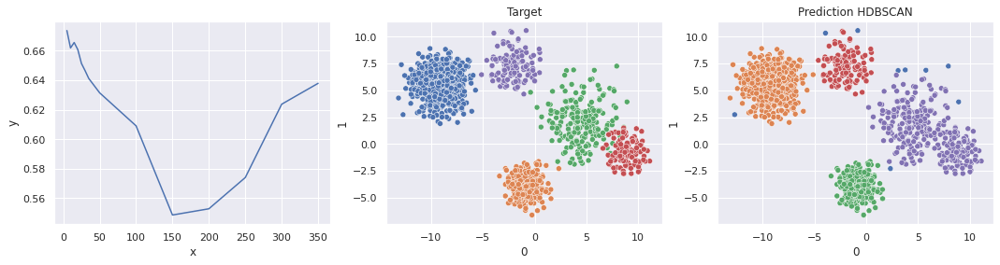

Best min_cluster_size = 5
[HDBSCAN]: accuracy 0.9772


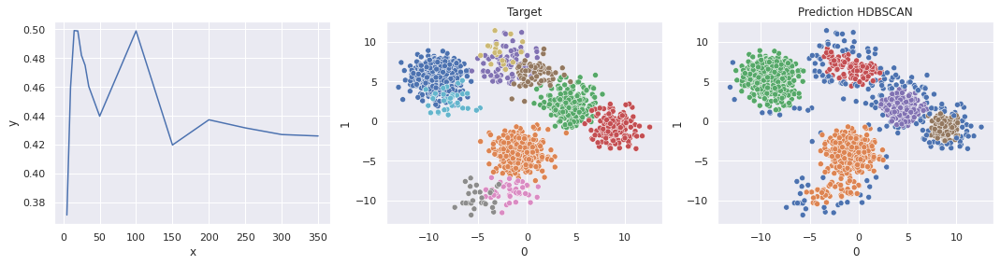

Best min_cluster_size = 15
[HDBSCAN]: accuracy 0.9373


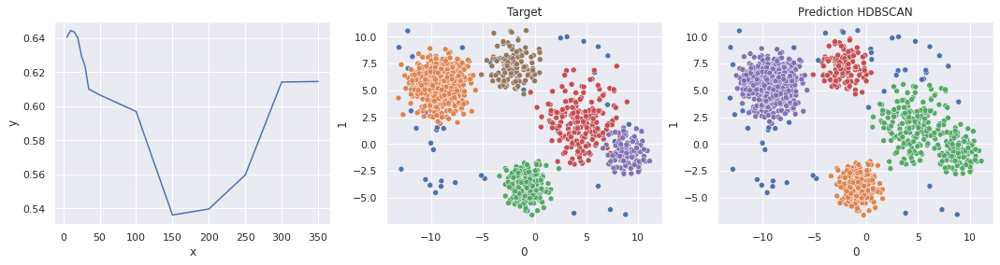

Best min_cluster_size = 10
[HDBSCAN]: accuracy 0.9685


In [22]:
run_HDBSCAN_on_data(UNBALANCED_GAUSSIAN_BLOBS_DATA, list(range(5, 40, 5)) + list(range(50, 400, 50)), "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

### Cube

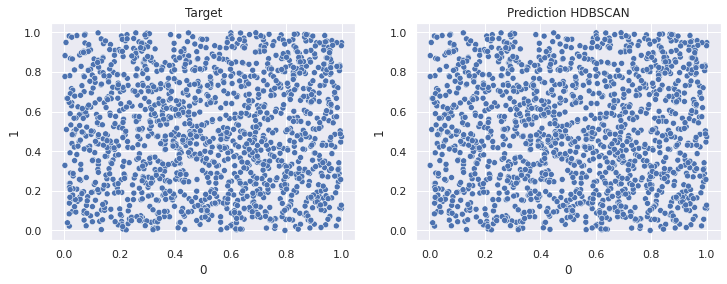

[HDBSCAN]: accuracy 1.0000, time 0.129, mem 3.730Mb


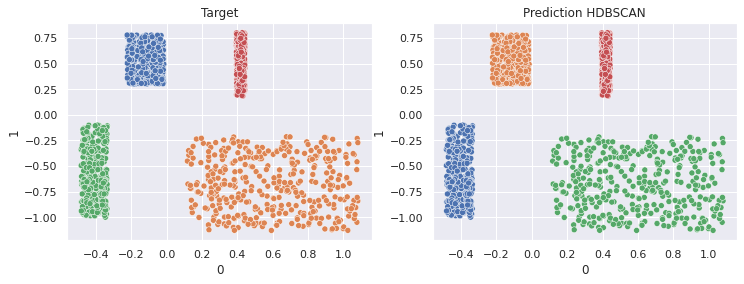

[HDBSCAN]: accuracy 1.0000, time 0.097, mem 0.482Mb


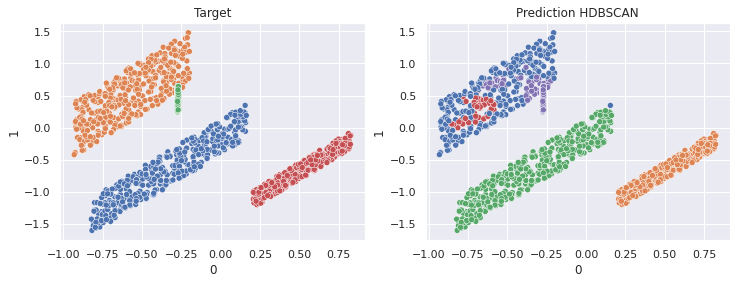

[HDBSCAN]: accuracy 0.9492, time 0.084, mem 1.208Mb


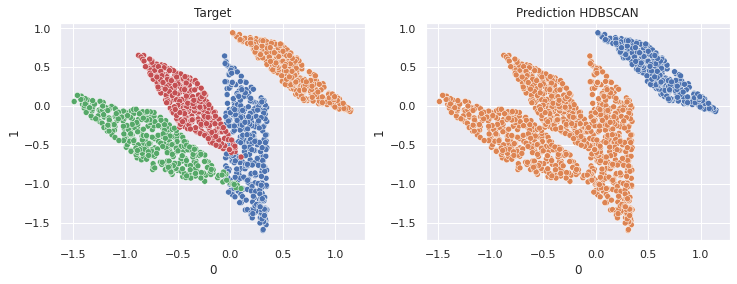

[HDBSCAN]: accuracy 0.6247, time 0.093, mem 0.492Mb


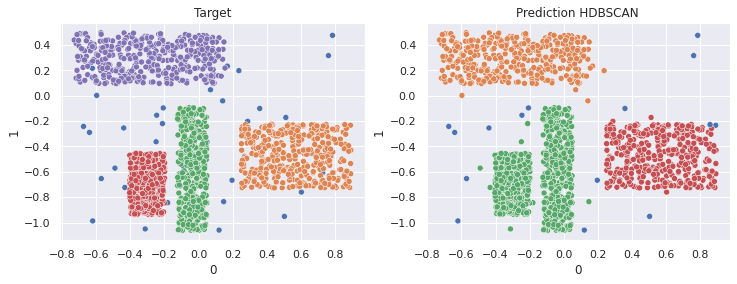

[HDBSCAN]: accuracy 0.8660, time 0.093, mem 1.029Mb


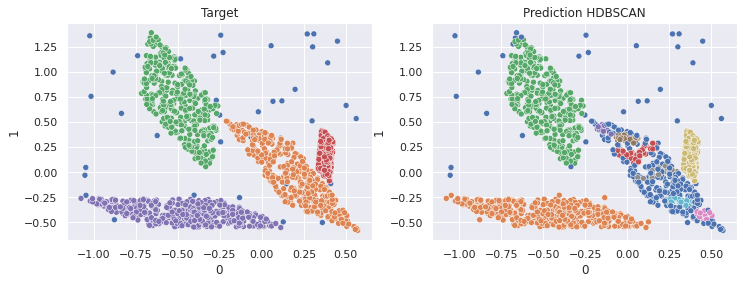

[HDBSCAN]: accuracy 0.9472, time 0.093, mem 0.350Mb


In [23]:
min_cluster_size_range = [100, 10, 30, 10, 25, 10, 45, 40, 100]
run_HDBSCAN_on_data_with_K(CUBES_RECT_PARALLEL_DATA, min_cluster_size_range, "CUBES_RECT_PARALLEL", path=ROOT_DATA)

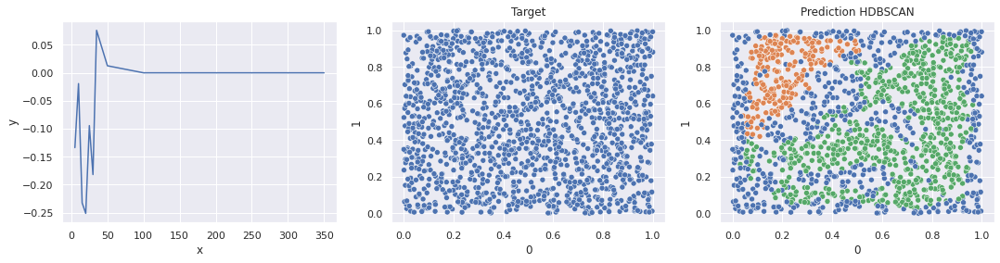

Best min_cluster_size = 35
[HDBSCAN]: accuracy 0.3905


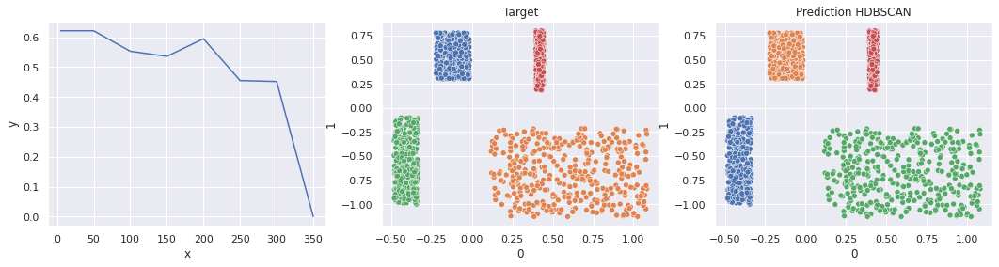

Best min_cluster_size = 5
[HDBSCAN]: accuracy 1.0000


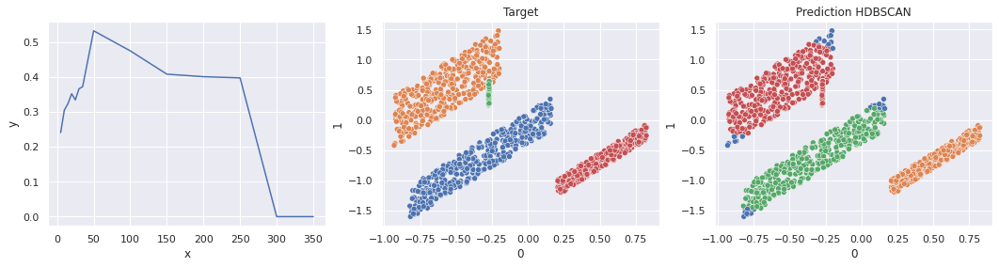

Best min_cluster_size = 50
[HDBSCAN]: accuracy 0.8680


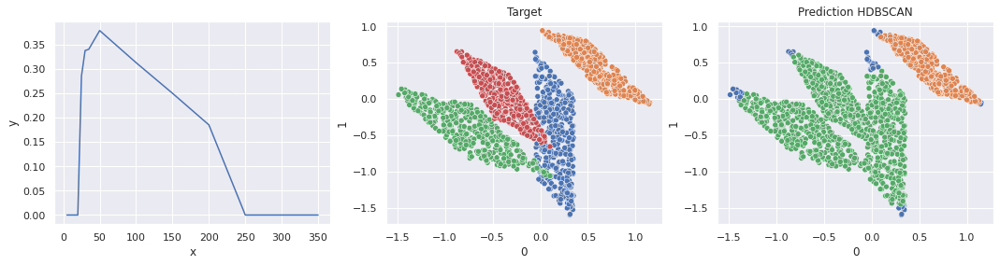

Best min_cluster_size = 50
[HDBSCAN]: accuracy 0.6348


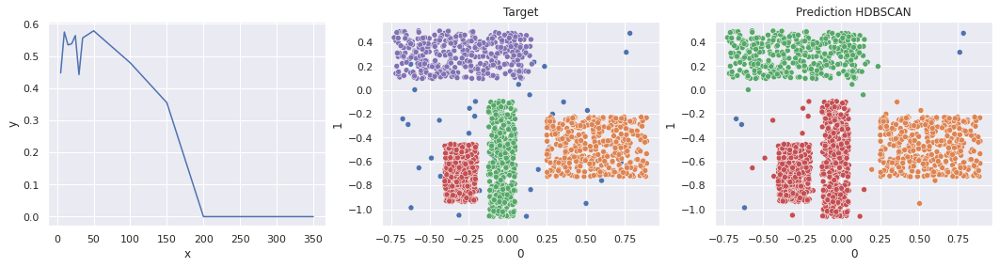

Best min_cluster_size = 50
[HDBSCAN]: accuracy 0.8625


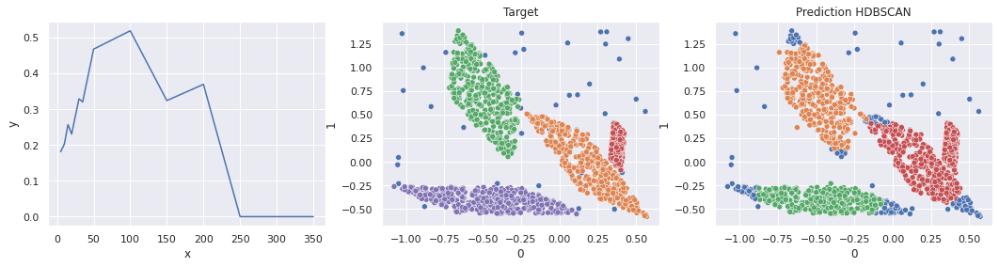

Best min_cluster_size = 100
[HDBSCAN]: accuracy 0.8481


In [24]:
run_HDBSCAN_on_data(CUBES_RECT_PARALLEL_DATA, list(range(5, 40, 5)) + list(range(50, 400, 50)), "CUBES_RECT_PARALLEL", path=ROOT_DATA)

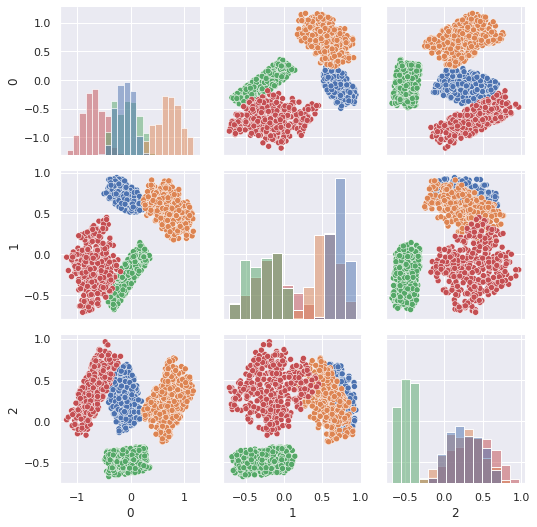

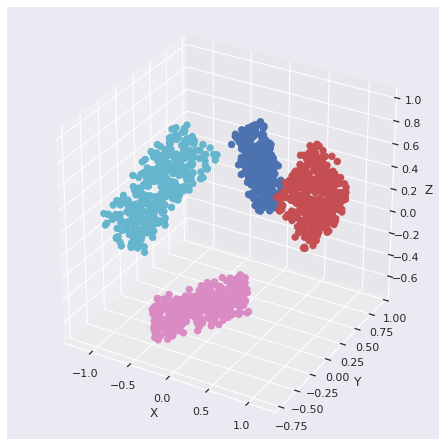

[HDBSCAN]: accuracy 0.8739, time 0.093, mem 0.559Mb


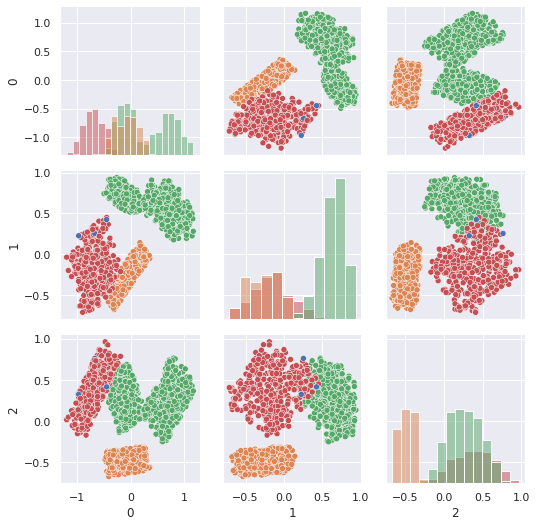

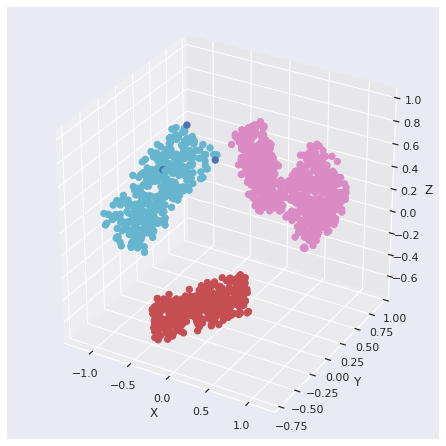

In [25]:
X, y = get_data_cube_3d()
run_on_3d_data(X, y, 15, data_name="CUBES_RECT_PARALLEL", path=ROOT_DATA)

### Non-spherical

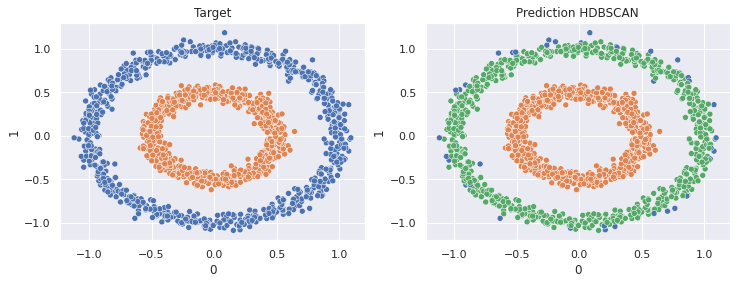

[HDBSCAN]: accuracy 0.9741, time 0.105, mem 1.804Mb


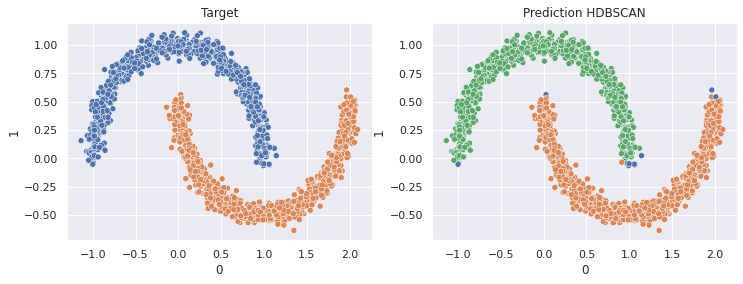

[HDBSCAN]: accuracy 0.9914, time 0.102, mem 2.833Mb


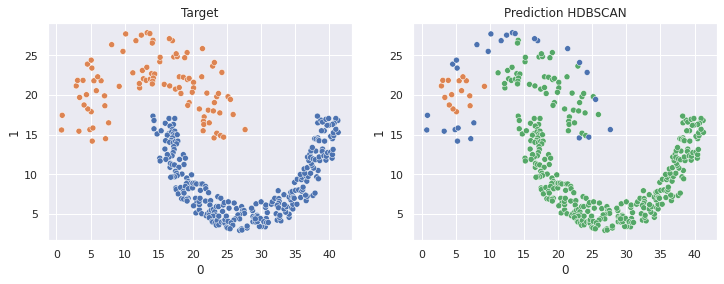

[HDBSCAN]: accuracy 0.7421, time 0.036, mem 0.179Mb


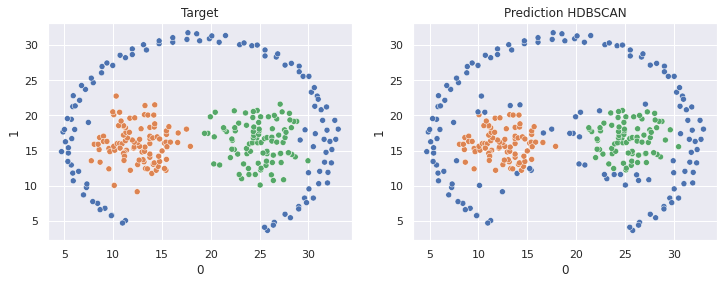

[HDBSCAN]: accuracy 0.8542, time 0.028, mem 0.329Mb


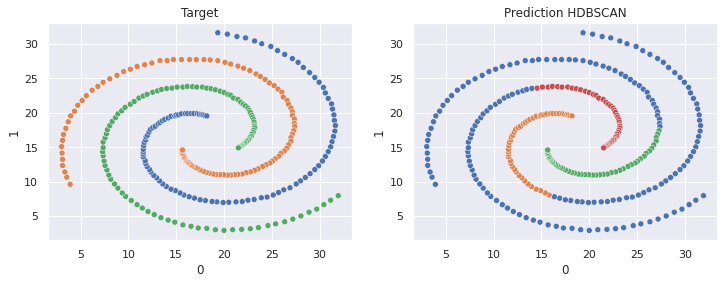

[HDBSCAN]: accuracy 0.6379, time 0.016, mem 0.140Mb


In [26]:
min_cluster_size_range = [50, 75, 15, 40, 13, 8]

run_HDBSCAN_on_data_with_K(NON_SPHERICAL_DATA, min_cluster_size_range, "NON_SPHERICAL", path=ROOT_DATA)

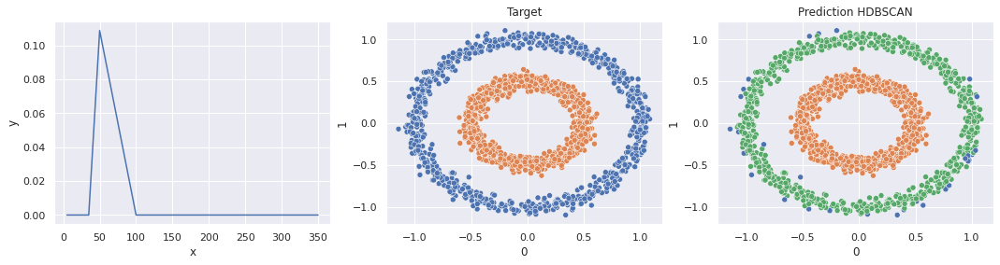

Best min_cluster_size = 50
[HDBSCAN]: accuracy 0.9790


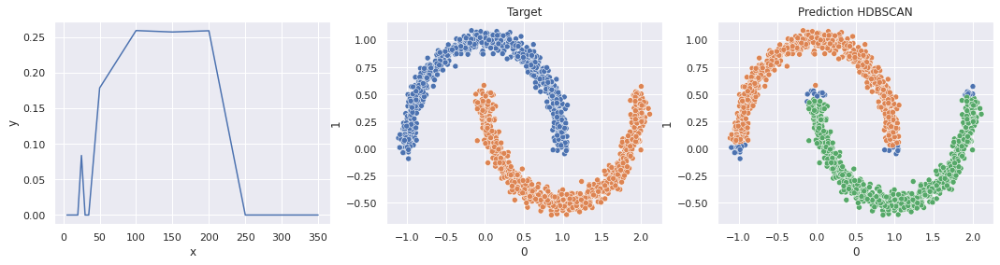

Best min_cluster_size = 100
[HDBSCAN]: accuracy 0.9711


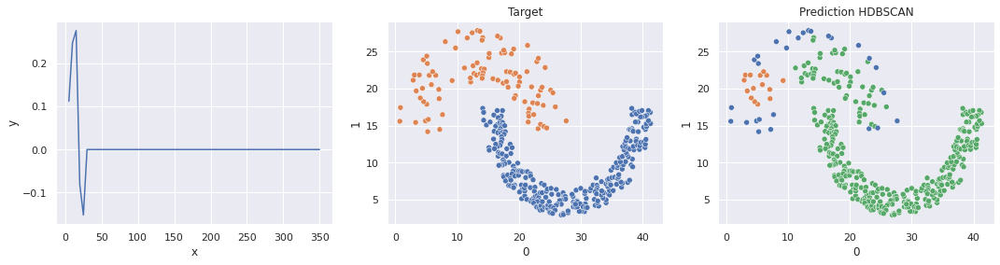

Best min_cluster_size = 15
[HDBSCAN]: accuracy 0.7421


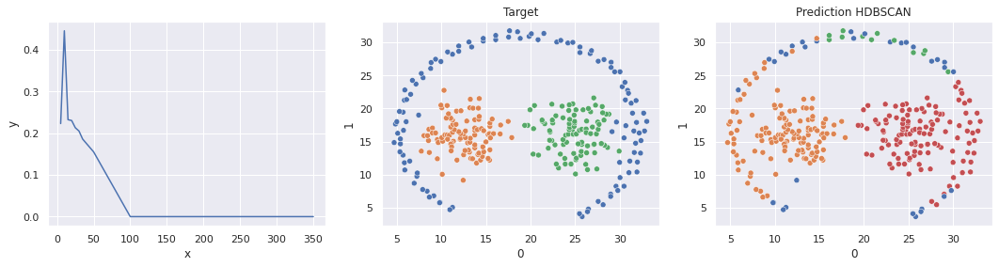

Best min_cluster_size = 10
[HDBSCAN]: accuracy 0.7584


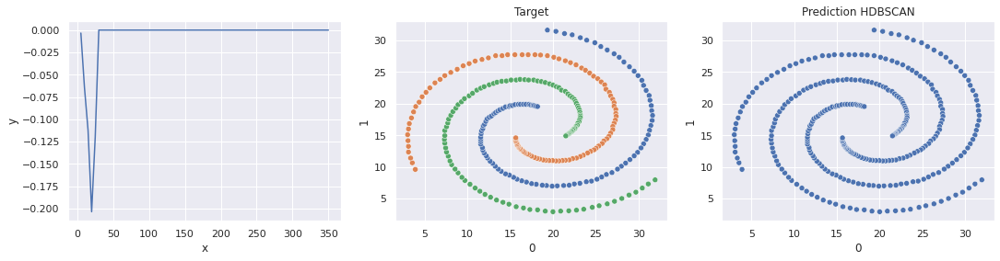

Best min_cluster_size = 30
[HDBSCAN]: accuracy 0.3313


In [27]:
run_HDBSCAN_on_data(NON_SPHERICAL_DATA, list(range(5, 40, 5)) + list(range(50, 400, 50)), "NON_SPHERICAL", path=ROOT_DATA)

### Other forms

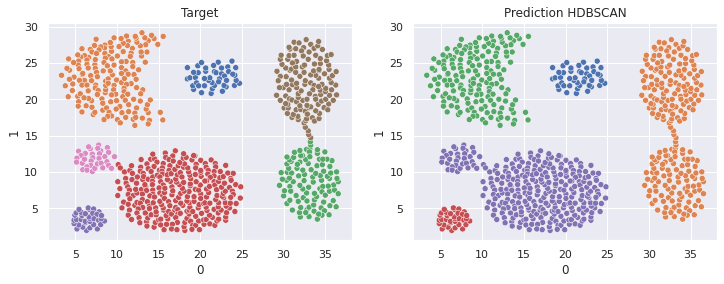

[HDBSCAN]: accuracy 0.9273, time 0.062, mem 0.133Mb


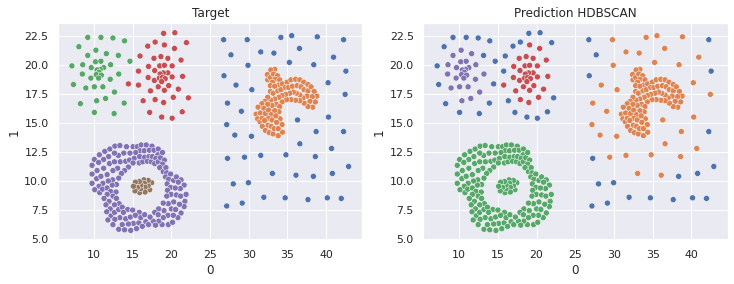

[HDBSCAN]: accuracy 0.9065, time 0.036, mem 0.188Mb


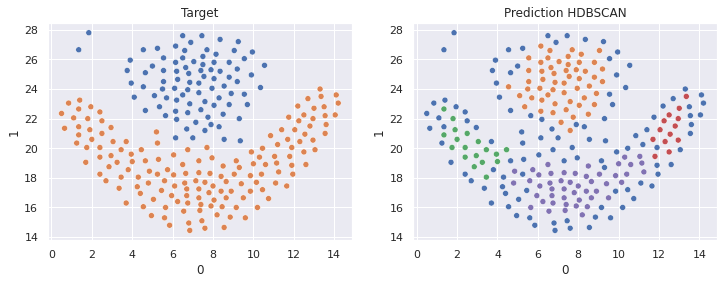

[HDBSCAN]: accuracy 0.5888, time 0.015, mem 0.073Mb


In [28]:
min_cluster_size_range = [3, 15, 6]

run_HDBSCAN_on_data_with_K(OTHER_FORMS_DATA, min_cluster_size_range, "OTHER_FORMS", path=ROOT_DATA)

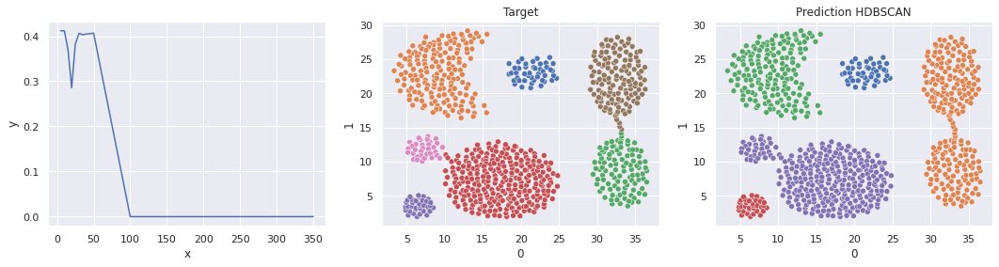

Best min_cluster_size = 5
[HDBSCAN]: accuracy 0.9273


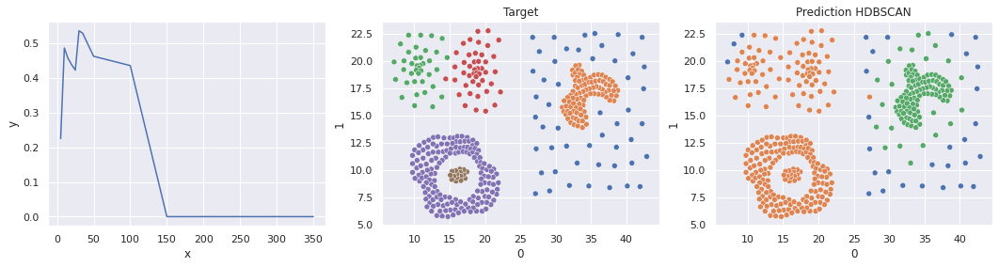

Best min_cluster_size = 30
[HDBSCAN]: accuracy 0.7339


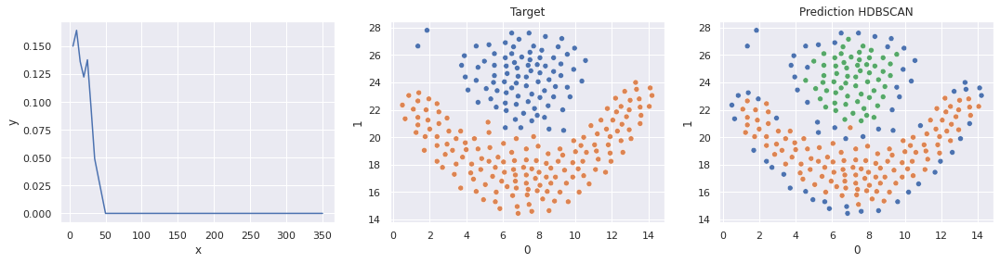

Best min_cluster_size = 10
[HDBSCAN]: accuracy 0.7554


In [29]:
run_HDBSCAN_on_data(OTHER_FORMS_DATA, list(range(5, 40, 5)) + list(range(50, 400, 50)), "OTHER_FORMS", path=ROOT_DATA)

### Real dataset (Iris)

In [30]:
import pandas as pd
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

iris = datasets.load_iris()
iris_labels = iris.target
data = pd.DataFrame(iris.data,columns = iris.feature_names)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [31]:
scaler = MinMaxScaler()
data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,0.222222,0.625000,0.067797,0.041667
1,0.166667,0.416667,0.067797,0.041667
2,0.111111,0.500000,0.050847,0.041667
3,0.083333,0.458333,0.084746,0.041667
4,0.194444,0.666667,0.067797,0.041667


In [32]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(data)
PCA_iris_data = pd.DataFrame(data = principalComponents , columns = ['pc1', 'pc2','pc3'])

PCA_iris_data.head()

,pc1,pc2,pc3
0,-0.630703,0.107578,-0.018719
1,-0.622905,-0.104260,-0.049142
2,-0.669520,-0.051417,0.019644
3,-0.654153,-0.102885,0.023219
4,-0.648788,0.133488,0.015116


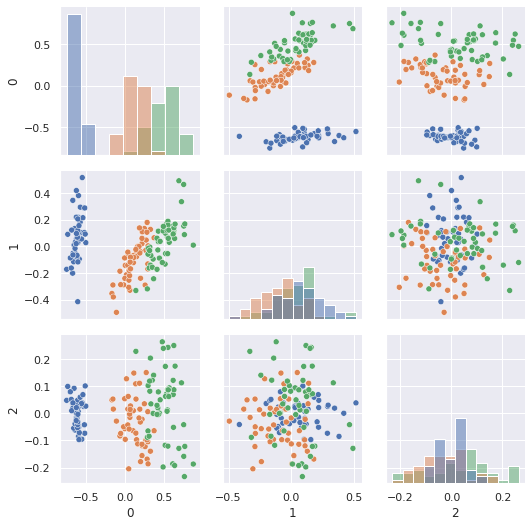

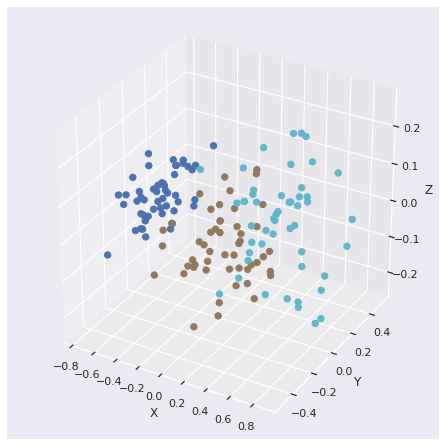

[HDBSCAN]: accuracy 0.7763, time 0.017, mem 0.037Mb


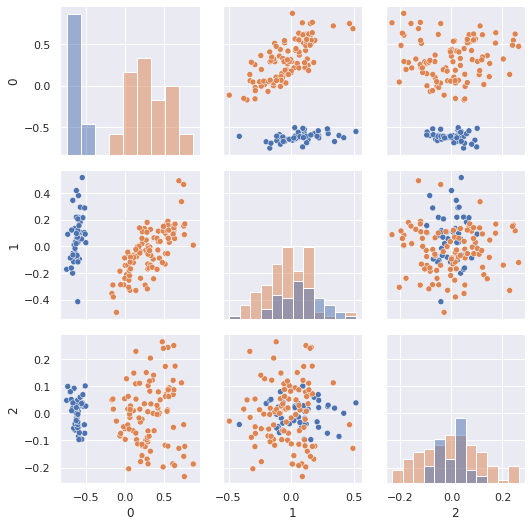

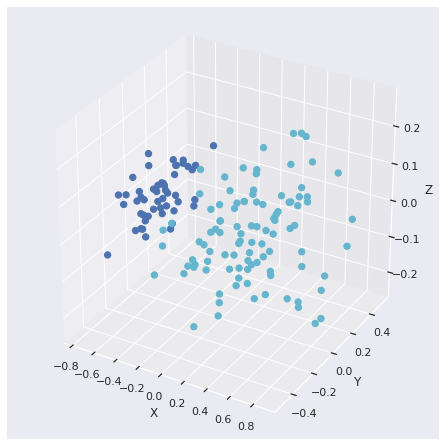

In [33]:
run_on_3d_data(PCA_iris_data.values, iris_labels, 2, data_name="Real_Data", path=ROOT_DATA)

## Time and Memory tests

In [34]:
from hdbscan_utils import evaluation_time_of_working_by_min_cluster_size, evaluation_time_of_working_by_size, evaluation_mem_of_working_by_min_cluster_size, evaluation_mem_of_working_by_size

K_RANGE = [2, 3, 5, 8, 10, 15, 30]

100%|██████████| 7/7 [00:07<00:00,  1.04s/it]


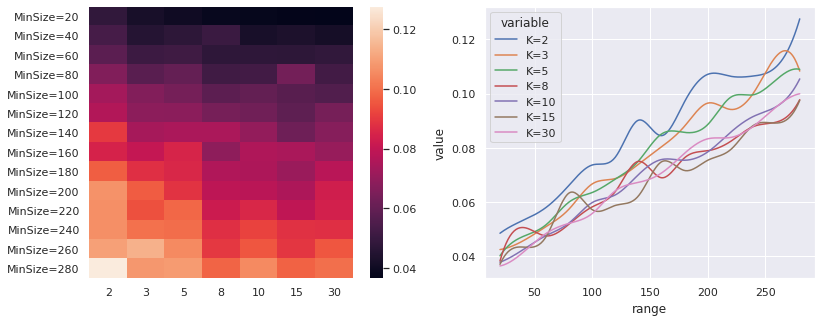

In [35]:
evaluation_time_of_working_by_min_cluster_size(K_RANGE, 
                                               finding_min_cluster_size=list(range(20, 300, 20)),
                                               total_size=2000,
                                               path=ROOT_DATA)

100%|██████████| 13/13 [00:25<00:00,  1.93s/it]


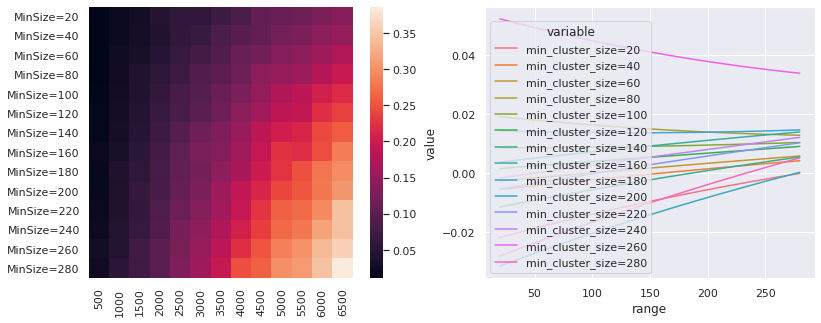

In [36]:
evaluation_time_of_working_by_size(7, 
                                   finding_min_cluster_size = list(range(20, 300, 20)),
                                   path=ROOT_DATA)

100%|██████████| 7/7 [00:12<00:00,  1.81s/it]


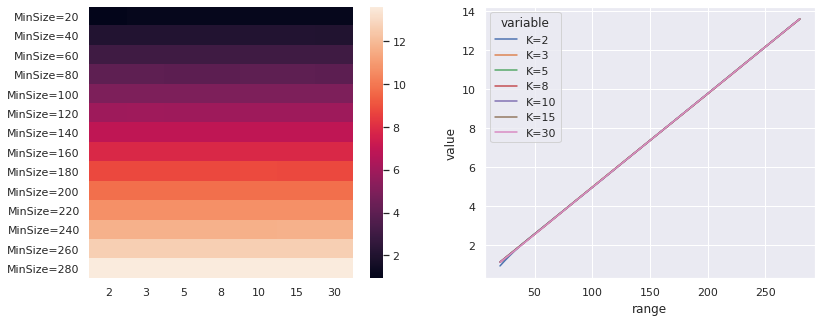

In [37]:
evaluation_mem_of_working_by_min_cluster_size(K_RANGE, 
                               finding_min_cluster_size=list(range(20, 300, 20)),
                               total_size=2000,                                
                               path=ROOT_DATA)

100%|██████████| 13/13 [00:42<00:00,  3.29s/it]


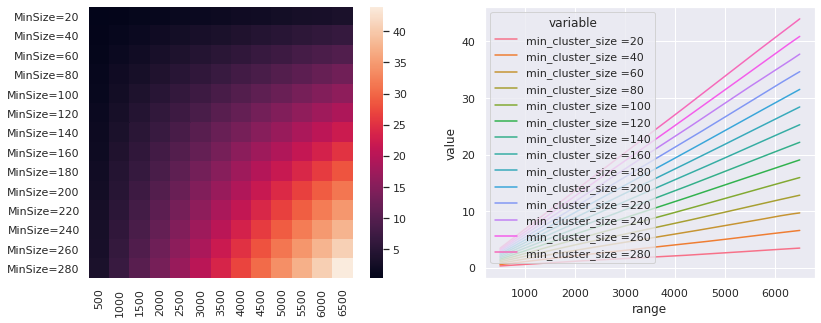

In [38]:
evaluation_mem_of_working_by_size(7, 
                                  finding_min_cluster_size=list(range(20, 300, 20)),
                                  path=ROOT_DATA)

## Check Stability and Initial dependency 

In [39]:
from hdbscan_utils import check_init_dependency, check_stability

100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


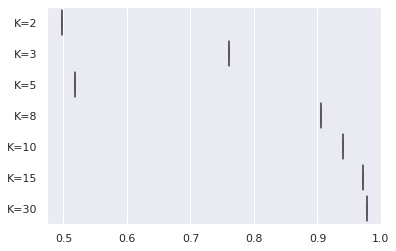

In [40]:
check_init_dependency(path=ROOT_DATA)

100%|██████████| 6/6 [00:07<00:00,  1.19s/it]


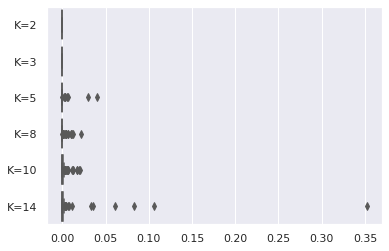

In [41]:
check_stability(path=ROOT_DATA)